# Waste Dataset EDA

쓰레기 객체 검출 데이터셋(train.json)을 탐색하기 위한 노트북입니다. Kaggle EDA 노트북을 참고해 주요 통계를 시각화했습니다.


In [1]:
import pandas as pd; pd.options.mode.chained_assignment = None
import numpy as np

# Built In Imports
from datetime import datetime
from glob import glob
import warnings
import IPython
import urllib
import zipfile
import pickle
import shutil
import string
import math
import tqdm
import time
import os
import gc
import re
from pathlib import Path

# Visualization Imports
from matplotlib.colors import ListedColormap
import matplotlib.patches as patches
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from PIL import Image
import matplotlib
import plotly
import PIL
import cv2
from pycocotools.coco import COCO

# Other Imports
from tqdm.notebook import tqdm

LABEL_COLORS = [px.colors.label_rgb(px.colors.convert_to_RGB_255(x)) for x in sns.color_palette("Spectral", 10)]
LABEL_COLORS_WOUT_NO_FINDING = LABEL_COLORS[:8]+LABEL_COLORS[9:]


In [ ]:
# COCO json -> dataframe
DATA_DIR = Path('/data/ephemeral/home/pro-cv-objectdetection-cv-11-sj/dataset')
coco = COCO(str(DATA_DIR / 'train.json'))

train_df = pd.DataFrame()

image_ids = []
class_name = []
class_id = []
x_min = []
y_min = []
x_max = []
y_max = []
classes = ["General trash", "Paper", "Paper pack", "Metal", "Glass", 
           "Plastic", "Styrofoam", "Plastic bag", "Battery", "Clothing"]
for image_id in coco.getImgIds():
    image_info = coco.loadImgs(image_id)[0]
    ann_ids = coco.getAnnIds(imgIds=image_info['id'])
    anns = coco.loadAnns(ann_ids)
    file_name = image_info['file_name']
    for ann in anns:
        image_ids.append(file_name)
        class_name.append(classes[ann['category_id']])
        class_id.append(ann['category_id'])
        x_min.append(float(ann['bbox'][0]))
        y_min.append(float(ann['bbox'][1]))
        x_max.append(float(ann['bbox'][0]) + float(ann['bbox'][2]))
        y_max.append(float(ann['bbox'][1]) + float(ann['bbox'][3]))

train_df['image_id'] = image_ids
train_df['class_name'] = class_name
train_df['class_id'] = class_id
train_df['x_min'] = x_min
train_df['y_min'] = y_min
train_df['x_max'] = x_max
train_df['y_max'] = y_max
train_df.head()


loading annotations into memory...
Done (t=0.06s)
creating index...
index created!


,image_id,class_name,class_id,x_min,y_min,x_max,y_max
0,train/0000.jpg,General trash,0,197.6,193.7,745.4,663.4
1,train/0001.jpg,Metal,3,0.0,407.4,57.6,588.0
2,train/0001.jpg,Plastic bag,7,0.0,455.6,144.6,637.2
3,train/0001.jpg,Glass,4,722.3,313.4,996.6,565.3
4,train/0001.jpg,Plastic,5,353.2,671.0,586.9,774.4


## Sample Images with Bounding Boxes

무작위로 5개 이미지를 선택해 원본과 바운딩 박스를 함께 확인합니다.


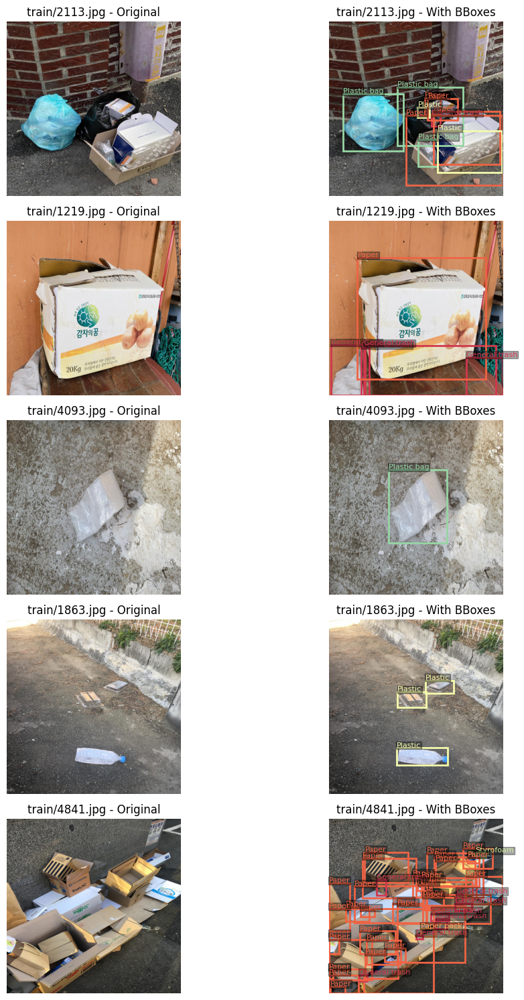

In [3]:
# Randomly inspect 5 images with their bounding boxes
sample_image_ids = np.random.choice(train_df['image_id'].unique(), size=5, replace=False)
palette = sns.color_palette('Spectral', 10)

fig, axes = plt.subplots(len(sample_image_ids), 2, figsize=(12, 3 * len(sample_image_ids)))
if len(sample_image_ids) == 1:
    axes = np.array([axes])

for row_idx, image_id in enumerate(sample_image_ids):
    img_path = DATA_DIR / image_id
    image = np.array(Image.open(img_path).convert('RGB'))
    ann_rows = train_df[train_df['image_id'] == image_id]

    axes[row_idx, 0].imshow(image)
    axes[row_idx, 0].set_title(f'{image_id} - Original')
    axes[row_idx, 0].axis('off')

    axes[row_idx, 1].imshow(image)
    for _, ann in ann_rows.iterrows():
        width = ann['x_max'] - ann['x_min']
        height = ann['y_max'] - ann['y_min']
        edge_color = palette[int(ann['class_id'])]

        rect = patches.Rectangle((ann['x_min'], ann['y_min']), width, height,
                                 linewidth=2, edgecolor=edge_color, facecolor='none')
        axes[row_idx, 1].add_patch(rect)
        axes[row_idx, 1].text(ann['x_min'], ann['y_min'] - 3, ann['class_name'],
                             color=edge_color, fontsize=8,
                             bbox=dict(facecolor='black', alpha=0.35, pad=0.5))

    axes[row_idx, 1].set_title(f'{image_id} - With BBoxes')
    axes[row_idx, 1].axis('off')

fig.tight_layout()
plt.show()


In [9]:
gt_image_count = train_df[train_df['class_name'] == "General trash"]['image_id'].nunique()
print("General trash가 포함된 이미지 수:", gt_image_count)


General trash가 포함된 이미지 수: 2105


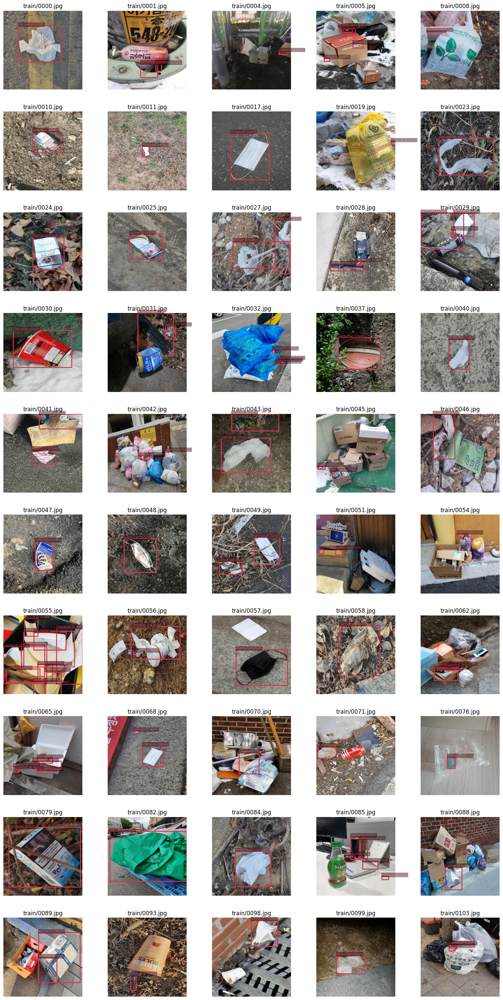

In [8]:
# Filter images that contain at least one "General trash"
general_trash_images = train_df[train_df['class_name'] == "General trash"]['image_id'].unique()

# Sort for sequential order
general_trash_images = sorted(general_trash_images)

# Select first 50 images (or fewer if not enough)
sample_image_ids = general_trash_images[:50]

palette = sns.color_palette('Spectral', 10)

# 10 x 5 grid
rows, cols = 10, 5
fig, axes = plt.subplots(rows, cols, figsize=(15, 30))

axes = axes.reshape(-1)  # flatten axes for easier indexing

for idx, image_id in enumerate(sample_image_ids):
    ax = axes[idx]

    img_path = DATA_DIR / image_id
    image = np.array(Image.open(img_path).convert('RGB'))

    # Filter only General trash annotations
    ann_rows = train_df[(train_df['image_id'] == image_id) &
                        (train_df['class_name'] == "General trash")]

    ax.imshow(image)

    # Draw all general trash bboxes
    for _, ann in ann_rows.iterrows():
        width = ann['x_max'] - ann['x_min']
        height = ann['y_max'] - ann['y_min']
        edge_color = palette[int(ann['class_id'])]

        rect = patches.Rectangle(
            (ann['x_min'], ann['y_min']),
            width, height,
            linewidth=2,
            edgecolor=edge_color,
            facecolor='none'
        )
        ax.add_patch(rect)

        ax.text(
            ann['x_min'], ann['y_min'] - 3,
            ann['class_name'],
            color=edge_color, fontsize=8,
            bbox=dict(facecolor='black', alpha=0.35, pad=0.5)
        )

    ax.set_title(f"{image_id}")
    ax.axis("off")

# Hide unused axes (if fewer than 50 images)
for ax in axes[len(sample_image_ids):]:
    ax.axis("off")

fig.tight_layout()
plt.show()


In [29]:
# Annotation per image
fig = px.histogram(train_df.image_id.value_counts(), 
                   log_y=True, color_discrete_sequence=['indianred'], opacity=0.7,
                   labels={"value":"Number of Annotations Per Image"},
                   title="<b>DISTRIBUTION OF # OF ANNOTATIONS PER IMAGE   "                          "<i><sub>(Log Scale for Y-Axis)</sub></i></b>")
fig.update_layout(showlegend=False,
                  xaxis_title="<b>Number of Unique Images</b>",
                  yaxis_title="<b>Count of All Object Annotations</b>")
fig.show()


In [30]:
# Unique classes per image
fig = px.histogram(train_df.groupby('image_id')["class_id"].unique().apply(lambda x: len(x)), 
             log_y=True, color_discrete_sequence=['skyblue'], opacity=0.7,
             labels={"value":"Number of Unique class"},
             title="<b>DISTRIBUTION OF # OF Unique Class PER IMAGE   "                    "<i><sub>(Log Scale for Y-Axis)</sub></i></b>")
fig.update_layout(showlegend=False,
                  xaxis_title="<b>Number of Unique CLASS</b>",
                  yaxis_title="<b>Count of Unique IMAGE</b>")
fig.show()


In [31]:
# Annotation counts per class
fig = px.bar(train_df.class_name.value_counts().sort_index(), 
             color=train_df.class_name.value_counts().sort_index().index, opacity=0.85,
             color_discrete_sequence=LABEL_COLORS, log_y=True,
             labels={"y":"Annotations Per Class", "x":""},
             title="<b>Annotations Per Class</b>")
fig.update_layout(legend_title=None,
                  xaxis_title="",
                  yaxis_title="<b>Annotations Per Class</b>")
fig.show()


  0%|          | 0/23144 [00:00<?, ?it/s]

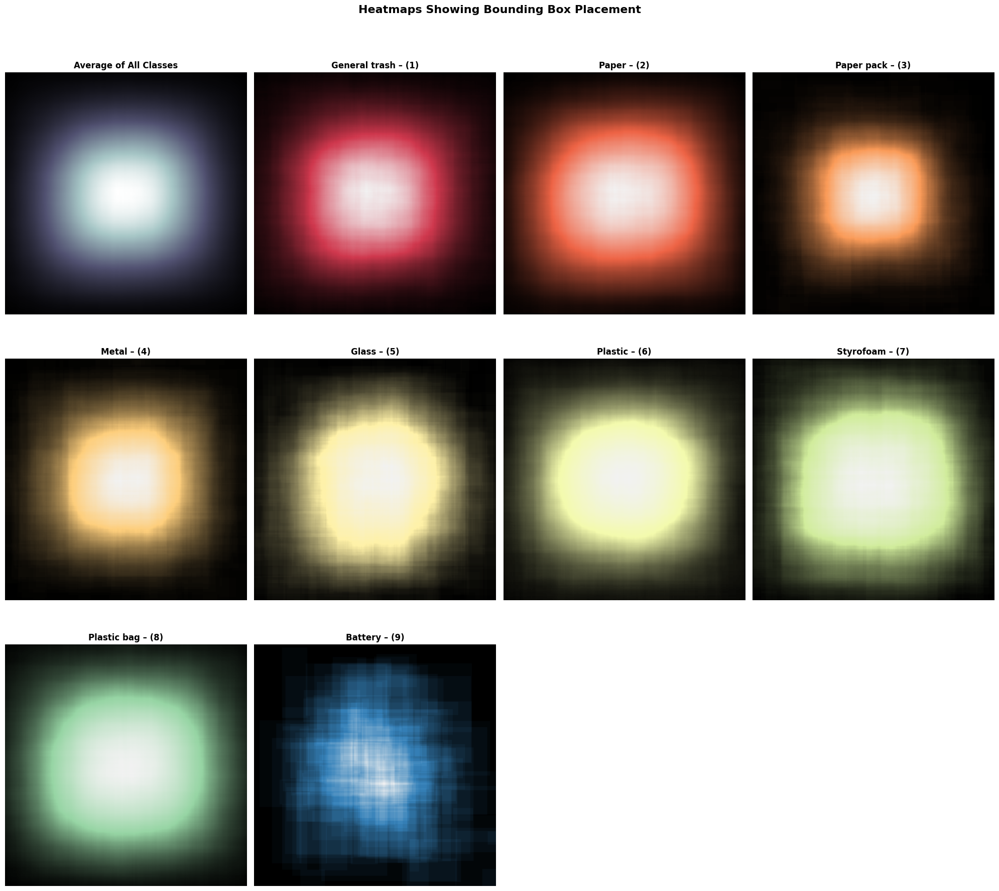

In [32]:
# Object heatmap
bbox_df = pd.DataFrame()
bbox_df['class_id'] = train_df['class_id'].values
bbox_df['class_name'] = train_df['class_name'].values
bbox_df['x_min'] = train_df['x_min'].values / 1024
bbox_df['x_max'] = train_df['x_max'].values / 1024
bbox_df['y_min'] = train_df['y_min'].values / 1024
bbox_df['y_max'] = train_df['y_max'].values / 1024
bbox_df['frac_x_min'] = train_df['x_min'].values / 1024
bbox_df['frac_x_max'] = train_df['x_max'].values / 1024
bbox_df['frac_y_min'] = train_df['y_min'].values / 1024
bbox_df['frac_y_max'] = train_df['y_max'].values / 1024

ave_src_img_height = 1024
ave_src_img_width = 1024

HEATMAP_SIZE = (ave_src_img_height, ave_src_img_width, 14)
heatmap = np.zeros((HEATMAP_SIZE), dtype=np.int16)
bbox_np = bbox_df[["class_id", "frac_x_min", "frac_x_max", "frac_y_min", "frac_y_max"]].to_numpy()
bbox_np[:, 1:3] *= ave_src_img_width
bbox_np[:, 3:5] *= ave_src_img_height
bbox_np = np.floor(bbox_np).astype(np.int16)

custom_cmaps = [
    matplotlib.colors.LinearSegmentedColormap.from_list(
        colors=[(0.,0.,0.), c, (0.95,0.95,0.95)], 
        name=f"custom_{i}") for i,c in enumerate(sns.color_palette("Spectral", 10))
]
custom_cmaps.pop(8) # Remove No-Finding

for row in tqdm(bbox_np, total=bbox_np.shape[0]):
    heatmap[row[3]:row[4]+1, row[1]:row[2]+1, row[0]] += 1
    
fig = plt.figure(figsize=(20,25))
plt.suptitle("Heatmaps Showing Bounding Box Placement\n ", fontweight="bold", fontsize=16)
for i in range(10):
    plt.subplot(4, 4, i+1)
    if i==0:
        plt.imshow(heatmap.mean(axis=-1), cmap="bone")
        plt.title(f"Average of All Classes", fontweight="bold")
    else:
        plt.imshow(heatmap[:, :, i-1], cmap=custom_cmaps[i-1])
        plt.title(f"{classes[i-1]} – ({i})", fontweight="bold")
        
    plt.axis(False)
fig.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


In [33]:
# Distribution of bbox area
bbox_df["frac_bbox_area"] = (bbox_df["frac_x_max"]-bbox_df["frac_x_min"])*(bbox_df["frac_y_max"]-bbox_df["frac_y_min"])

fig = px.box(bbox_df.sort_values(by="class_name"), x="class_name", y="frac_bbox_area", color="class_name", 
             color_discrete_sequence=LABEL_COLORS_WOUT_NO_FINDING, notched=True,
             labels={"class_name":"Class Name", "frac_bbox_area":"BBox Area (%)"},
             title="<b>DISTRIBUTION OF BBOX AREAS AS % OF SOURCE IMAGE AREA   "                    "<i><sub>(Some Upper Outliers Excluded For Better Visualization)</sub></i></b>")

fig.update_layout(showlegend=True,
                  yaxis_range=[-0.025,0.4],
                  legend_title_text=None,
                  xaxis_title="",
                  yaxis_title="<b>Bounding Box Area %</b>")
fig.show()


## 클래스별 BBox 크기 요약

클래스별 박스의 가로/세로 길이, 면적 통계를 보고 추가로 분포를 시각화합니다.


In [34]:
# Width / Height / Area stats by class
bbox_df['width'] = bbox_df['x_max'] - bbox_df['x_min']
bbox_df['height'] = bbox_df['y_max'] - bbox_df['y_min']
bbox_df['area_px'] = bbox_df['width'] * bbox_df['height']

size_stats = (bbox_df
    .groupby('class_name')[['width', 'height', 'area_px', 'frac_bbox_area']]
    .agg(['mean', 'median', 'min', 'max'])
    .round(1)
)
size_stats


width                  height                  area_px         \
               mean median  min  max   mean median  min  max    mean median   
class_name                                                                    
Battery         0.2    0.2  0.0  0.8    0.2    0.2  0.0  0.6     0.0    0.0   
Clothing        0.4    0.3  0.0  1.0    0.4    0.3  0.0  1.0     0.2    0.1   
General trash   0.2    0.1  0.0  1.0    0.2    0.1  0.0  1.0     0.1    0.0   
Glass           0.2    0.2  0.0  0.9    0.3    0.2  0.0  1.0     0.1    0.0   
Metal           0.2    0.2  0.0  0.9    0.3    0.2  0.0  1.0     0.1    0.0   
Paper           0.3    0.2  0.0  1.0    0.2    0.2  0.0  1.0     0.1    0.0   
Paper pack      0.2    0.2  0.0  0.9    0.2    0.2  0.0  1.0     0.1    0.0   
Plastic         0.2    0.2  0.0  1.0    0.2    0.2  0.0  1.0     0.1    0.0   
Plastic bag     0.3    0.2  0.0  1.0    0.3    0.3  0.0  1.0     0.1    0.1   
Styrofoam       0.3    0.3  0.0  1.0    0.2    0.2  0.0  1.0     0.1    0.0   

                        frac_bbox_area                   
               min  max           mean median  min  max  
class_name                                               
Battery        0.0  0.3            0.0    0.0  0.0  0.3  
Clothing       0.0  1.0            0.2    0.1  0.0  1.0  
General trash  0.0  1.0            0.1    0.0  0.0  1.0  
Glass          0.0  0.7            0.1    0.0  0.0  0.7  
Metal          0.0  0.7            0.1    0.0  0.0  0.7  
Paper          0.0  1.0            0.1    0.0  0.0  1.0  
Paper pack     0.0  0.9            0.1    0.0  0.0  0.9  
Plastic        0.0  1.0            0.1    0.0  0.0  1.0  
Plastic bag    0.0  1.0            0.1    0.1  0.0  1.0  
Styrofoam      0.0  0.9            0.1    0.0  0.0  0.9

/var/folders/05/cvkr89bd0r59mk0ts5kln8mw0000gn/T/ipykernel_55404/554889111.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/05/cvkr89bd0r59mk0ts5kln8mw0000gn/T/ipykernel_55404/554889111.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




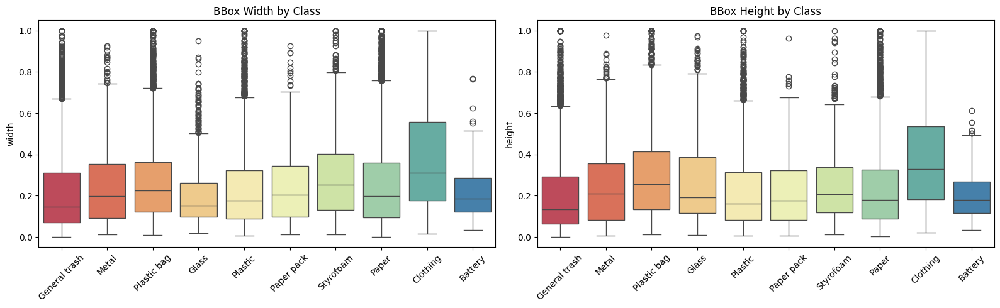

In [40]:
# Seaborn palette: HEX format
LABEL_COLORS_SNS = sns.color_palette("Spectral", 10).as_hex()

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sns.boxplot(data=bbox_df, x='class_name', y='width', palette=LABEL_COLORS_SNS, ax=axes[0])
axes[0].set_title('BBox Width by Class')
axes[0].set_xlabel('')
axes[0].tick_params(axis='x', rotation=45)

sns.boxplot(data=bbox_df, x='class_name', y='height', palette=LABEL_COLORS_SNS, ax=axes[1])
axes[1].set_title('BBox Height by Class')
axes[1].set_xlabel('')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


# Width vs Height scatter (sampled for readability)
sampled = bbox_df.sample(n=2000, random_state=42) if len(bbox_df) > 2000 else bbox_df
fig = px.scatter(sampled, x='width', y='height', color='class_name',
                 opacity=0.6, color_discrete_sequence=LABEL_COLORS,
                 labels={'width': 'BBox Width (px)', 'height': 'BBox Height (px)'},
                 title='<b>Width vs Height by Class (sampled)</b>',
                 hover_data=['class_name'])
fig.update_layout(legend_title_text='Class')
fig.show()


In [ ]:
bbox_df.dtypes


class_id            int64
class_name         object
x_min             float64
x_max             float64
y_min             float64
y_max             float64
frac_x_min        float64
frac_x_max        float64
frac_y_min        float64
frac_y_max        float64
frac_bbox_area    float64
dtype: object

In [ ]:
bbox_df["aspect_ratio"] = (bbox_df["x_max"] - bbox_df["x_min"]) / \
                          (bbox_df["y_max"] - bbox_df["y_min"])

aspect_means = bbox_df.groupby("class_id")["aspect_ratio"].mean()

fig = px.bar(
    x=classes,
    y=aspect_means.values,
    color=classes,
    opacity=0.85,
    color_discrete_sequence=LABEL_COLORS_WOUT_NO_FINDING,
    labels={"x":"Class Name", "y":"Aspect Ratio (W/H)"},
    title="<b>Aspect Ratios For Bounding Boxes By Class</b>"
)

fig.update_layout(
    yaxis_title="<b>Aspect Ratio (W/H)</b>",
    xaxis_title=None,
    legend_title_text=None
)

fig.add_hline(y=1, line_width=2, line_dash="dot",
              annotation_font_size=10,
              annotation_text="<b>SQUARE ASPECT RATIO</b>",
              annotation_position="bottom left",
              annotation_font_color="black")

fig.add_hrect(y0=0, y1=0.5, line_width=0, fillcolor="red", opacity=0.125,
              annotation_text="<b>>2:1 VERTICAL RECTANGLE REGION</b>",
              annotation_position="bottom right",
              annotation_font_size=10,
              annotation_font_color="red")

fig.add_hrect(y0=2, y1=3.5, line_width=0, fillcolor="green", opacity=0.04,
              annotation_text="<b>>2:1 HORIZONTAL RECTANGLE REGION</b>",
              annotation_position="top right",
              annotation_font_size=10,
              annotation_font_color="green")

fig.show()
